## Reading PDF files to review our Documents Type

In [1]:
import os
path = r"C:\Users\MICROTEL\Downloads\Machine-Learning-Projects-main\Machine-Learning-Projects-main\Employees_Data_Detection\EmployeesData"
os.listdir(path)

['Change Status',
 'Contracts',
 'DUBAI INSURANCE COMPANY.pdf',
 'eVisa',
 'New Work Entry Permit - Employee',
 'output_images',
 'Passport',
 'Residence',
 'رسوم تاشيرة عمل.pdf',
 'رسوم تعديل وضع.pdf',
 'رسوم زيارة ثانية.pdf',
 'رسوم عقد عمل.pdf']

In [2]:
# Internal folder name
typeFolder = "Passport"

# Map internal folder names to human-readable names
Folder_Names = {
    "Change Status": "Change_of_Status_Documents",
    "Residence": "Residence_Documents",
    "eVisa Tourism": "Tourism_Visa_Documents",
    "eVisa Employment": "Employment_Visa_Documents",
    "Employment Contract Full Work": "Full_Employment_Contracts",
    "Passport": "Passport_Documents"
}

In [7]:
import os
import fitz  # PyMuPDF

folder_name = Folder_Names.get(typeFolder, typeFolder)
print(folder_name)

# Full folder path
folder_path = os.path.join(path, typeFolder)
print(folder_path)

Passport_Documents
C:\Users\MICROTEL\Downloads\Machine-Learning-Projects-main\Machine-Learning-Projects-main\Employees_Data_Detection\EmployeesData\Passport


In [8]:
# This is a list comprehension in Python. It creates a list of .pdf files found in the folder folder_path.
files = [f for f in os.listdir(folder_path) if f.lower().endswith('.pdf')]
print(files)

['myPassport.pdf']


In [10]:
# This is a list comprehension in Python. It creates a list of .pdf files found in the folder folder_path.
files = [f for f in os.listdir(folder_path) if f.lower().endswith('.pdf')]

# Open PDF file ( Indices relate to files number in the above list)
if files:
    pdf_path = os.path.join(folder_path, files[0])
    doc = fitz.open(pdf_path)
    text= doc[0].get_text()
    print(f"Reading from: {folder_name}")
    print(text)
else:
    print(f"No PDF files found in: {folder_path}")

Reading from: Passport_Documents



Convert PDF to Image and then use OCR to extract text from the image.


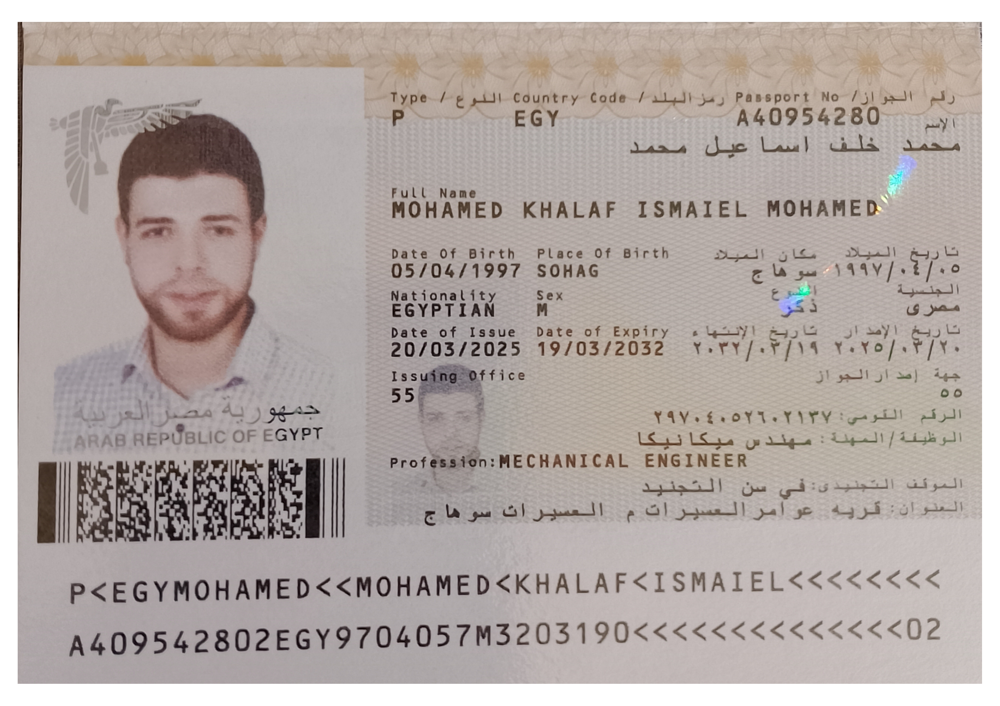

In [11]:
from PIL import Image
import io

import fitz  # PyMuPDF

# Convert each page of the PDF to an image and save/display
pdf_doc = fitz.open(pdf_path)
images = []
for i, page in enumerate(pdf_doc):
    pix = page.get_pixmap(dpi=300)
    img = Image.open(io.BytesIO(pix.tobytes("png"))).convert("RGB")
    images.append(img)
    # Optionally save the image
    img.save(f"page_{i+1}.png")
    # Optionally display the image in notebook
    display(img)
    break

##  Large Language Models (LLMs)

#### 1. QWEN OCR:
- Multilingual Support:
- Trained on large-scale data that includes Chinese, English, and other languages.
- Strong performance on mixed-language content (e.g., Chinese-English text).
- QWEN OCR is a proprietary model focused on text extraction.
- QWEN OCR is specifically designed for extracting text from images of documents, tables, and payslips.
- Qwen2-VL-2B-OCR is a fine-tuned variant of unsloth/Qwen2-VL-2B-Instruct, optimized specifically for Optical Character Recognition (OCR).

In [1]:
from transformers import AutoProcessor, AutoModelForImageTextToText
import requests
import torch
# Define the size dictionary with the required keys
# These values are based on the error message's suggested default if size is None
# You might need to adjust these based on the specific model documentation if available
processor_kwargs = {
    "size": {"shortest_edge": 56 * 56, "longest_edge": 28 * 28 * 1280}
}

# Load model from local path
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = r"C:\Users\MICROTEL\Downloads\Machine-Learning-Projects-main\Machine-Learning-Projects-main\Employees_Data_Detection\Qwen2-VL-2B-OCR"

processor = AutoProcessor.from_pretrained(model_path, **processor_kwargs)
model = AutoModelForImageTextToText.from_pretrained(model_path)

# model = AutoModelForImageTextToText.from_pretrained(model_path, torch_dtype=torch.float16, device_map="auto") # auto device placement, offloading to CPU if needed
model = AutoModelForImageTextToText.from_pretrained(model_path, torch_dtype=torch.float16)  # Move model to the specified device (GPU or CPU)

c:\Users\MICROTEL\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
You have video processor config saved in `preprocessor.json` file which is deprecated. Video processor configs should be saved in their own `video_preprocessor.json` file. You can rename the file or load and save the processor back which renames it automatically. Loading from `preprocessor.json` will be removed in v5.0.


In [ ]:
import requests
import torch
import time
from torchvision import io
from typing import Dict

#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move model to the right device
# model = model.to(device)

conversation = [
    {
        "role":"user",
        "content":[
            {
                "type":"image",
            },
            {
                "type":"text",
                "text": (
                    "Detect the document type (e.g., Visa, Change Status, Employment Contract), "
                    "then extract key fields accordingly."
                    "For Visa (TOURISM or EMPLOYMENT): Visa Type, Date & Place of Issue, Valid Until, "
                    "U.I.D No, Full Name, Nationality, Passport No, Profession."
                    "For Change Status: U.I.D No, Name, Nationality, Passport No, Employer Name, "
                    "'Residence must be stamped up to' + date."
                    "For Employment Contract: Transaction Number, Name, Nationality, Passport Number, "
                    "Date of Birth, Contract Duration."
)
            }
        ]
    }
]


# Preprocess the inputs
text_prompt = processor.apply_chat_template(conversation, add_generation_prompt=True)
# Excepted output: '<|im_start|>system\nYou are a helpful assistant.<|im_end|>\n<|im_start|>user\n<|vision_start|><|image_pad|><|vision_end|>Describe this image.<|im_end|>\n<|im_start|>assistant\n'

inputs = processor(text=[text_prompt], images=[img], padding=True, return_tensors="pt")
#inputs = inputs.to('cuda')
# Move input tensors to the same device
inputs = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in inputs.items()}



start = time.time() 
# Inference: Generation of the output
output_ids = model.generate(**inputs, max_new_tokens=2048)
#generated_ids = [output_ids[len(input_ids):] for input_ids, output_ids in zip(inputs.input_ids, output_ids)]
generated_ids = [output_ids[len(input_ids):] for input_ids, output_ids in zip(inputs["input_ids"], output_ids)]

output_text = processor.batch_decode(generated_ids, skip_special_tokens=True, clean_up_tokenization_spaces=True)
elapsed = time.time() - start
print(f"Inference time: {elapsed:.2f} sec")

Inference time: 5.31 sec


In [26]:
print(output_text[0])

Employment Contract
Transaction Number: MB291046226AE
Work Style: Full Work
Employer Name: NOOR ALMAMZAR MEDICAL CENTRE LLC
Nationality: COMMONWEALTH OF DOMINICA
Date of Birth: 10/10/1998
Contract Duration: 2 years
U.I.D No: NS067782
Full Name: MARWAN F M ZENATY
Nationality: PALESTINE
Passport No: N016323869
Profession: Telecommunication Assistant
Validity Period: 21/05/2025 to 20/05/2027
Page 1 of 2
صفحة 1 من 2
